# AudioCLIP Demo

Authored by [Andrey Guzhov](https://github.com/AndreyGuzhov)

This notebook covers common use cases of AudioCLIP and provides the typical workflow.
Below, you will find information on:

0. [Binary Assets](#Downloading-Binary-Assets)
1. [Required imports](#Imports-&-Constants)
2. [Model Instantiation](#Model-Instantiation)
3. [Data Transformation](#Audio-&-Image-Transforms)
4. Data Loading
    * [Audio](#Audio-Loading)
    * [Images](#Image-Loading)
5. [Preparation of the Input](#Input-Preparation)
6. [Acquisition of the Output](#Obtaining-Embeddings)
7. [Normalization of Embeddings](#Normalization-of-Embeddings)
8. [Calculation of Logit Scales](#Obtaining-Logit-Scales)
9. [Computation of Similarities](#Computing-Similarities)
10. Performing Tasks
    1. [Classification](#Classification)
        1. [Audio](#Audio)
        2. [Images](#Images)
    2. [Querying](#Querying)
        1. [Audio by Text](#Audio-by-Text)
        2. [Images by Text](#Images-by-Text)
        3. [Audio by Images](#Audio-by-Images)
        4. [Images by Audio](#Images-by-Audio)

## Downloading Binary Assets

In [ ]:
! wget -P ../assets/ https://github.com/AndreyGuzhov/AudioCLIP/releases/download/v0.1/bpe_simple_vocab_16e6.txt.gz
! wget -P ../assets/ https://github.com/AndreyGuzhov/AudioCLIP/releases/download/v0.1/AudioCLIP-Full-Training.pt

## Imports & Constants

In [1]:
import os
import sys
import glob

import librosa
import librosa.display
import pandas as pd

import simplejpeg
import numpy as np

import torch
import torchvision as tv

import matplotlib.pyplot as plt

from PIL import Image
from IPython.display import Audio, display

sys.path.append(os.path.abspath(f'{os.getcwd()}/..'))

from model import AudioCLIP
from utils.transforms import ToTensor1D


torch.set_grad_enabled(False)

MODEL_FILENAME = 'AudioCLIP-Full-Training.pt'
# derived from ESResNeXt
SAMPLE_RATE = 44100
# derived from CLIP
IMAGE_SIZE = 224
IMAGE_MEAN = 0.48145466, 0.4578275, 0.40821073
IMAGE_STD = 0.26862954, 0.26130258, 0.27577711

#LABELS = ['cat', 'thunderstorm', 'coughing', 'alarm clock', 'car horn']
LABELS = ['animals are cool thing', 'bunker', 'elevator', 'engine', 'rollercoaster'] # as clotho has 5 labels; should we just give all 25 labels ? 

## Model Instantiation

In [2]:
aclp = AudioCLIP(pretrained=f'../assets/AudioCLIP-Full-Training.pt')

## Audio & Image Transforms

In [3]:
audio_transforms = ToTensor1D()

image_transforms = tv.transforms.Compose([
    tv.transforms.ToTensor(),
    tv.transforms.Resize(IMAGE_SIZE, interpolation=Image.BICUBIC),
    tv.transforms.CenterCrop(IMAGE_SIZE),
    tv.transforms.Normalize(IMAGE_MEAN, IMAGE_STD)
])

/home/sfauth/miniconda3/envs/MAGIC/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  """
/home/sfauth/miniconda3/envs/MAGIC/lib/python3.7/site-packages/torchvision/transforms/transforms.py:258: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


## Audio Loading
Audio samples from Clotho_v2.1. Copy Clotho *.wav files (folder 'test') to the directory audio_clotho_v2.1 to use Clotho!

In [4]:
paths_to_audio = glob.glob('audio_clotho_v2.1/test/*.wav')[0:5]
#paths_to_audio = glob.glob('audio/*.wav')[0:5]

audio = list()
for path_to_audio in paths_to_audio:
    track, _ = librosa.load(path_to_audio, sr=SAMPLE_RATE, dtype=np.float32)

    # compute spectrograms using trained audio-head (fbsp-layer of ESResNeXt)
    # thus, the actual time-frequency representation will be visualized
    spec = aclp.audio.spectrogram(torch.from_numpy(track.reshape(1, 1, -1)))
    spec = np.ascontiguousarray(spec.numpy()).view(np.complex64)
    pow_spec = 10 * np.log10(np.abs(spec) ** 2 + 1e-18).squeeze()

    audio.append((track, pow_spec))

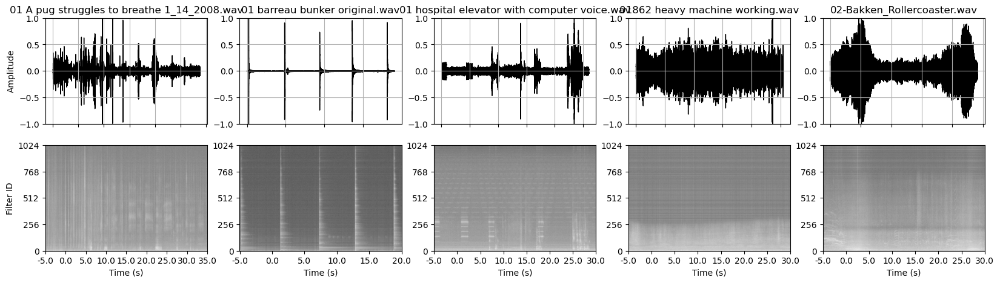

01 A pug struggles to breathe 1_14_2008.wav


01 barreau bunker original.wav


01 hospital elevator with computer voice.wav


01862 heavy machine working.wav


02-Bakken_Rollercoaster.wav


In [5]:
fig, axes = plt.subplots(2, len(audio), figsize=(20, 5), dpi=100)

for idx in range(len(audio)):
    track, pow_spec = audio[idx]

    # draw the waveform
    librosa.display.waveshow(track, sr=SAMPLE_RATE, ax=axes[0, idx], color='k')
    # show the corresponding power spectrogram
    axes[1, idx].imshow(pow_spec, origin='lower', aspect='auto', cmap='gray', vmin=-180.0, vmax=20.0)

    # modify legend
    axes[0, idx].set_title(os.path.basename(paths_to_audio[idx]))
    axes[0, idx].set_xlabel('')
    axes[0, idx].set_xticklabels([])
    axes[0, idx].grid(True)
    axes[0, idx].set_ylim(bottom=-1, top=1)

    axes[1, idx].set_xlabel('Time (s)')
    axes[1, idx].set_xticks(np.linspace(0, pow_spec.shape[1], len(axes[0, idx].get_xticks())))
    axes[1, idx].set_xticklabels([f'{tick:.1f}' if tick == int(tick) else '' for tick in axes[0, idx].get_xticks()])
    axes[1, idx].set_yticks(np.linspace(0, pow_spec.shape[0] - 1, 5))

axes[0, 0].set_ylabel('Amplitude')
axes[1, 0].set_ylabel('Filter ID')

plt.show()
plt.close(fig)

for idx, path in enumerate(paths_to_audio):
    print(os.path.basename(path))
    display(Audio(audio[idx][0], rate=SAMPLE_RATE, embed=True))

## Input Preparation: unsuccessful padding

In [11]:
reshaped_tracks = [audio_transforms(track.reshape(1, -1)) for track, _ in audio]
max_track_length = max([np.shape(track)[1] for track in reshaped_tracks])
n_zeros_to_pad = [max_track_length - track.shape[1] for track in reshaped_tracks]

for _, track in enumerate(reshaped_tracks):
    input_zero_padder = torch.nn.ZeroPad2d((1, n_zeros_to_pad[_]))
    reshaped_tracks[_] = input_zero_padder(track)

In [33]:
audio = torch.stack(reshaped_tracks)
padded_embeddings, _ = aclp(audio=audio)

## Input Preparation: inefficient copying

Dirty workaround to avoid padding, as we can't mask later: process always two tensors at a time (1 vector with real data and one vector of same dimensions). Delete the second vector's embedding. and follow up with next vectors. Create a list of these tensors

In [5]:
reshaped_tracks = [audio_transforms(track.reshape(1, -1)) for track, _ in audio]

repeated_tracks = [audio.repeat(2, 1) for audio in reshaped_tracks]

In [6]:
# AudioCLIP handles raw audio on input, so the input shape is [batch x channels x duration]
audio = repeated_tracks
# standard channel-first shape [batch x channels x height x width]
#images = torch.stack([image_transforms(image) for image in images])
# textual input is processed internally, so no need to transform it beforehand
#text = [[label] for label in LABELS]

read in captions

In [7]:
import pandas as pd
captions_raw = pd.read_csv("clotho_captions_evaluation.csv").set_index("file_name").sort_index()
captions = captions_raw[captions_raw.columns[0]]
captions = captions.values.tolist()
test_captions = captions[0:5]  # take first 5 caption sets of evaluation set 

In [8]:
captions_as_list = [[label] for label in test_captions]
((_, _, text_features), _), _ = aclp(text=captions_as_list)

In [9]:
audio_features_repeated = [aclp(audio=audio_track) for audio_track in audio]
audio_features = torch.stack([feature_vector[0][0][0][0] for _, feature_vector in enumerate(audio_features_repeated)])

In [31]:
torch.nn.functional.cosine_similarity(audio_features[0], text_features[0])

IndexError: Dimension out of range (expected to be in range of [-1, 0], but got 1)

## Other examples (not Clotho)

In [32]:
sample_1 = [
            "The person is rummaging through the pans while looking for something.",
            "two metallic objects hitting each other as a person is walking around",
            "The fingers scrape on a plain metal tin.",
            "The person is rummaging through the pans looking.",
            "fingers scrape on a metal tin, and have no apparent pattern"
        ]

sample_2 = [
            "A sequences of static chattering followed by a loud squealing repeats twice.",
            "Loud squealing follows static chattering, repeating twice before the sequence ends.",
            "A weed whacker is started but sputters while bugs are chirping and a dog is barking in the distance.",
            "Repeating clicking gets faster until making a continues high pitch sound which slows and repeats",
            "A weed whacker starts up but sputters immediately while bugs chirp and a dog barks in the distance."
        ]

In [43]:
text_list = [sample_1, sample_2]

samples = []

for sample in text_list:
    samples.append([[caption] for caption in sample])

In [44]:
embeddings = []

for sample in samples:
    ((_, _, text_features), _), _ = aclp(text=sample)
    embeddings.append(text_features)


## Obtaining Embeddings
For the sake of clarity, all three modalities are processed separately.

Go in and extract features.

In [22]:
audio_features_repeated = [aclp(audio=audio_track) for audio_track in audio]
audio_features = torch.stack([feature_vector[0][0][0][0] for _, feature_vector in enumerate(audio_features_repeated)])

In [74]:
# AudioCLIP's output: Tuple[Tuple[Features, Logits], Loss]
# Features = Tuple[AudioFeatures, ImageFeatures, TextFeatures]
# Logits = Tuple[AudioImageLogits, AudioTextLogits, ImageTextLogits]


#((audio_features, _, _), _), _ = aclp(audio=audio[0])
((_, image_features, _), _), _ = aclp(image=images)
((_, _, text_features), _), _ = aclp(text=text)

In [61]:
image_features.shape

torch.Size([10, 1024])

In [75]:
text_features.shape

torch.Size([5, 1024])

## Normalization of Embeddings
The AudioCLIP's output is normalized using L<sub>2</sub>-norm

In [76]:
audio_features = audio_features / torch.linalg.norm(audio_features, dim=-1, keepdim=True)
image_features = image_features / torch.linalg.norm(image_features, dim=-1, keepdim=True)
text_features = text_features / torch.linalg.norm(text_features, dim=-1, keepdim=True)

## Obtaining Logit Scales
Outputs of the text-, image- and audio-heads are made consistent using dedicated scaling terms for each pair of modalities.
The scaling factors are clamped between 1.0 and 100.0.

In [45]:
scale_audio_image = torch.clamp(aclp.logit_scale_ai.exp(), min=1.0, max=100.0)
scale_audio_text = torch.clamp(aclp.logit_scale_at.exp(), min=1.0, max=100.0)
scale_image_text = torch.clamp(aclp.logit_scale.exp(), min=1.0, max=100.0)

## Computing Similarities
Similarities between different representations of a same concept are computed using [scaled](#Obtaining-Logit-Scales) dot product (cosine similarity).

In [46]:
logits_audio_image = scale_audio_image * audio_features @ image_features.T
logits_audio_text = scale_audio_text * audio_features @ text_features.T
logits_image_text = scale_image_text * image_features @ text_features.T

## Classification
This task is a specific case of a more general one, which is [querying](#Querying).
However, this setup is mentioned as a standalone because it demonstrates clearly how to perform usual classification (including [zero-shot inference](https://github.com/openai/CLIP#zero-shot-prediction)) using AudioCLIP.

### Audio

In [47]:
print('\t\tFilename, Audio\t\t\tTextual Label (Confidence)', end='\n\n')

# calculate model confidence
confidence = logits_audio_text.softmax(dim=1)
for audio_idx in range(len(paths_to_audio)):
    # acquire Top-3 most similar results
    conf_values, ids = confidence[audio_idx].topk(3)

    # format output strings
    query = f'{os.path.basename(paths_to_audio[audio_idx]):>30s} ->\t\t'
    results = ', '.join([f'{LABELS[i]:>15s} ({v:06.2%})' for v, i in zip(conf_values, ids)])

    print(query + results)

		Filename, Audio			Textual Label (Confidence)

01 A pug struggles to breathe 1_14_2008.wav ->		  rollercoaster (68.91%),        elevator (21.42%),          bunker (06.75%)
01 barreau bunker original.wav ->		  rollercoaster (68.45%),        elevator (22.10%),          bunker (06.64%)
01 hospital elevator with computer voice.wav ->		  rollercoaster (69.33%),        elevator (21.49%),          bunker (06.04%)
01862 heavy machine working.wav ->		  rollercoaster (61.01%),        elevator (27.39%),          bunker (08.43%)
   02-Bakken_Rollercoaster.wav ->		  rollercoaster (59.91%),        elevator (27.68%),          bunker (09.08%)


### Images

In [76]:
print('\tFilename, Image\t\t\tTextual Label (Confidence)', end='\n\n')

# calculate model confidence
confidence = logits_image_text.softmax(dim=1)
for image_idx in range(len(paths_to_images)):
    # acquire Top-3 most similar results
    conf_values, ids = confidence[image_idx].topk(3)

    # format output strings
    query = f'{os.path.basename(paths_to_images[image_idx]):>20s} ->\t\t'
    results = ', '.join([f'{LABELS[i]:>20s} ({v:06.2%})' for v, i in zip(conf_values, ids)])

    print(query + results)

	Filename, Image			Textual Label (Confidence)

          cars_1.jpg ->		            car horn (96.73%),             coughing (01.26%),         thunderstorm (01.01%)
          cars_2.jpg ->		            car horn (98.44%),             coughing (00.83%),         thunderstorm (00.42%)
           cat_1.jpg ->		                 cat (99.60%),          alarm clock (00.23%),             coughing (00.13%)
           cat_2.jpg ->		                 cat (99.39%),          alarm clock (00.45%),             coughing (00.13%)
         clock_1.jpg ->		         alarm clock (71.93%),             car horn (27.79%),             coughing (00.22%)
         clock_2.jpg ->		         alarm clock (97.97%),             car horn (01.66%),             coughing (00.16%)
      coughing_1.jpg ->		            coughing (83.60%),          alarm clock (08.53%),                  cat (02.94%)
      coughing_2.jpg ->		            coughing (96.22%),             car horn (02.63%),                  cat (00.59%)
     lightning_1.

## Querying

### Audio by Text

In [48]:
print('\t\tTextual Label\t\tFilename, Audio (Confidence)', end='\n\n')

# calculate model confidence
confidence = logits_audio_text.softmax(dim=0)
for label_idx in range(len(LABELS)):
    # acquire Top-2 most similar results
    conf_values, ids = confidence[:, label_idx].topk(2)

    # format output strings
    query = f'{LABELS[label_idx]:>25s} ->\t\t'
    results = ', '.join([f'{os.path.basename(paths_to_audio[i]):>30s} ({v:06.2%})' for v, i in zip(conf_values, ids)])

    print(query + results)

		Textual Label		Filename, Audio (Confidence)

                   animal ->		01862 heavy machine working.wav (24.02%), 01 hospital elevator with computer voice.wav (21.61%)
                   bunker ->		01862 heavy machine working.wav (25.75%),    02-Bakken_Rollercoaster.wav (20.67%)
                 elevator ->		01862 heavy machine working.wav (25.71%), 01 A pug struggles to breathe 1_14_2008.wav (20.04%)
                   engine ->		01 A pug struggles to breathe 1_14_2008.wav (23.41%), 01862 heavy machine working.wav (22.18%)
            rollercoaster ->		01 A pug struggles to breathe 1_14_2008.wav (23.52%), 01 hospital elevator with computer voice.wav (21.38%)


### Images by Text

In [25]:
print('\tTextual Label\t\t\tFilename, Image (Confidence)', end='\n\n')

# calculate model confidence
confidence = logits_image_text.softmax(dim=0)
for label_idx in range(len(LABELS)):
    # acquire Top-3 most similar results
    conf_values, ids = confidence[:, label_idx].topk(3)

    # format output strings
    query = f'{LABELS[label_idx]:>20s} ->\t\t'
    results = ', '.join([f'{os.path.basename(paths_to_images[i]):>20s} ({v:>06.2%})' for v, i in zip(conf_values, ids)])

    print(query + results)

	Textual Label			Filename, Image (Confidence)

                 cat ->		           cat_1.jpg (53.65%),            cat_2.jpg (46.31%),       coughing_2.jpg (00.02%)
        thunderstorm ->		     lightning_2.jpg (85.85%),      lightning_1.jpg (14.15%),           cars_1.jpg (00.00%)
            coughing ->		      coughing_2.jpg (84.81%),       coughing_1.jpg (05.84%),      lightning_2.jpg (04.64%)
         alarm clock ->		         clock_1.jpg (48.28%),      lightning_1.jpg (24.95%),          clock_2.jpg (13.99%)
            car horn ->		          cars_1.jpg (39.91%),           cars_2.jpg (28.05%),          clock_1.jpg (27.34%)


### Audio by Images

In [26]:
print('\tTextual Label\t\t\tFilename, Image (Confidence)', end='\n\n')

# calculate model confidence
confidence = logits_audio_image.softmax(dim=0)
for image_idx in range(len(paths_to_images)):
    # acquire Top-2 most similar results
    conf_values, ids = confidence[:, image_idx].topk(2)

    # format output strings
    query = f'{os.path.basename(paths_to_images[image_idx]):>25s} ->\t\t'
    results = ', '.join([f'{os.path.basename(paths_to_audio[i]):>30s} ({v:06.2%})' for v, i in zip(conf_values, ids)])

    print(query + results)

	Textual Label			Filename, Image (Confidence)

               cars_1.jpg ->		     car_horn_1-24074-A-43.wav (57.49%),  alarm_clock_3-120526-B-37.wav (32.02%)
               cars_2.jpg ->		     car_horn_1-24074-A-43.wav (95.42%),  alarm_clock_3-120526-B-37.wav (03.55%)
                cat_1.jpg ->		           cat_3-95694-A-5.wav (99.99%),      car_horn_1-24074-A-43.wav (00.01%)
                cat_2.jpg ->		           cat_3-95694-A-5.wav (99.98%),  alarm_clock_3-120526-B-37.wav (00.01%)
              clock_1.jpg ->		 alarm_clock_3-120526-B-37.wav (98.47%),      car_horn_1-24074-A-43.wav (00.65%)
              clock_2.jpg ->		 alarm_clock_3-120526-B-37.wav (98.20%),      thunder_3-144891-B-19.wav (01.34%)
           coughing_1.jpg ->		     coughing_1-58792-A-24.wav (83.49%),            cat_3-95694-A-5.wav (11.24%)
           coughing_2.jpg ->		     car_horn_1-24074-A-43.wav (51.46%),      coughing_1-58792-A-24.wav (34.07%)
          lightning_1.jpg ->		     thunder_3-144891-B-19.wav (99.

### Images by Audio

In [27]:
print('\tTextual Label\t\t\tFilename, Image (Confidence)', end='\n\n')

# calculate model confidence
confidence = logits_audio_image.softmax(dim=1)
for audio_idx in range(len(paths_to_audio)):
    # acquire Top-3 most similar results
    conf_values, ids = confidence[audio_idx].topk(3)

    # format output strings
    query = f'{os.path.basename(paths_to_audio[audio_idx]):>30s} ->\t\t'
    results = ', '.join([f'{os.path.basename(paths_to_images[i]):>15s} ({v:06.2%})' for v, i in zip(conf_values, ids)])

    print(query + results)

	Textual Label			Filename, Image (Confidence)

 alarm_clock_3-120526-B-37.wav ->		    clock_2.jpg (50.99%),     clock_1.jpg (36.81%),      cars_1.jpg (06.99%)
     car_horn_1-24074-A-43.wav ->		     cars_2.jpg (60.95%),  coughing_2.jpg (19.33%),      cars_1.jpg (18.93%)
           cat_3-95694-A-5.wav ->		      cat_1.jpg (50.27%),       cat_2.jpg (49.55%),  coughing_1.jpg (00.14%)
     coughing_1-58792-A-24.wav ->		 coughing_1.jpg (60.35%),  coughing_2.jpg (29.78%), lightning_1.jpg (04.02%)
     thunder_3-144891-B-19.wav ->		lightning_1.jpg (89.65%), lightning_2.jpg (09.07%),      cars_1.jpg (00.50%)
